<a href="https://colab.research.google.com/github/mcrn2000/MINE_4206_Analisis_con_Machine_Learning/blob/main/Limpieza_de_datosVer2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto - Entrega 2

### **1. Importando las librerias requeridas para el desarrollo del laboratorio**


Para la transformación de los datos, así como para el entrenamiento de los modelos y la visualización de los resultados, se importan las siguientes librerías:


**Nota:** Para asegurarse de tener las últimas versiones y todos los paquetes instalados que por lo general no vienen en Google Colab. pueden ejecutar la sigiuente celda.

In [20]:
%%shell
shred -u setup_colab_general.py
wget -q "https://github.com/jpcano1/python_utils/raw/main/setup_colab_general.py" -O setup_colab_general.py
pip install -q https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
pip install -q tqdm==4.56.0

In [212]:
#Data management Libraries
import pandas as pd
import numpy as np
import sys
from pandas_profiling import ProfileReport

# Data Modeling Libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, MaxAbsScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import make_column_selector, ColumnTransformer
from sklearn.model_selection import StratifiedShuffleSplit

# Data visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns

#Save the model
from joblib import dump, load
import statsmodels.api as sm
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV, KFold, cross_val_score
from sklearn import tree
from pydotplus import graph_from_dot_data
import IPython.display as display1
from PIL import Image, ImageDraw, ImageFont
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (classification_report, precision_score, accuracy_score,
                             recall_score, f1_score, confusion_matrix, plot_confusion_matrix)

### **2. Objetivo del Negocio**

El objetivo del negocio se centra en identificar en el transcurso del periodo académico, qué estudiantes pueden presentar un riesgo o tendencia a perder el curso o desertar del mismo. También se busca identificar de la misma forma los motivos, características o variables que detonaron la pérdida del curso o su abandono.

### **3. Perfilamiento de datos**

### Archivo de eventos

Los  archivos se obtienen  a partir de la plataforma Moodle, en la cuual se desacargan los informes respectivos  a las interacciones que realizan los estudiantes con cada uno de los recursos disponibles dentro de la plataforma, de la misma forma se descarga  el archivo de calificaciones de cada una de las activdades asi como  la definitiva.
Es de  aclarar que  en la distribución de las califcaciones se reconoce un primer corte del 75% y un segundo corte  en el 25% restante para completar un 100% de la calficación.

Al intentar cargar los datos mencionados anteriormente,  se obtuvo un error debido a la presencia de caracteres especiales, por ello fue necesario removerlos, para ello primero se transformó el texto a minúscula y luego se reemplazaron los caracteres especiales, este proceso se hizo usando la herramienta VsCode.

Luego se identificó que los registros tenían el siguiente formato:

"5/04/2021 15:27,""maria consuelo  rodriguez "",-,""curso: teoria de sistemas en las organizaciones - (204016a_951)"",registros,""informe de registro visualizado"",""the user with id '87' viewed the log report for the course with id '98'."",web,181.131.96.37"


Donde el uso de las comillas no permitía una adecuada lectura de los datos. Por ello se eliminan.
5/04/2021 15:27,maria consuelo  rodriguez ,-,curso: teoria de sistemas en las organizaciones - (204016a_951),registros,informe de registro visualizado,the user with id '87' viewed the log report for the course with id '98'.,web,181.131.96.37

Primero, se leen los datos y se visualizan que se hayan leido correctamente.

In [125]:
data = pd.read_csv('https://raw.githubusercontent.com/alexander-castro/test/main/logs.csv')

data.head()

,hora,nombre completo del usuario,usuario afectado,contexto del evento,componente,nombre evento,descripcion
0,5/4/2021 15:27,maria consuelo rodriguez,-,curso: teoria de sistemas en las organizacione...,registros,informe de registro visualizado,the user with id '87' viewed the log report fo...
1,5/4/2021 15:27,marco antonio rodriguez,john sebastian rojas cordoba,tarea: unidad 1 - fase 2 - identificacion y an...,tarea,formulario de calificaciones visto,the user with id '547402' viewed the grading f...
2,5/4/2021 15:27,marco antonio rodriguez,-,tarea: unidad 1 - fase 2 - identificacion y an...,tarea,visualizacion de las calificaciones,the user with id '547402' viewed the grading t...
3,5/4/2021 15:27,marco antonio rodriguez,-,tarea: unidad 1 - fase 2 - identificacion y an...,tarea,visualizacion de las calificaciones,the user with id '547402' viewed the grading t...
4,5/4/2021 15:27,marco antonio rodriguez,-,tarea: unidad 1 - fase 2 - identificacion y an...,tarea,visualizacion de las calificaciones,the user with id '547402' viewed the grading t...


**Hora**
Fecha y hora del evento
Fecha en formato dd/MM/yyyy hh:mm

**Nombre completo del usuario**
Nombre completo del usuario que realiza la acción 
Texto

**Usuario afectado**
Nombre completo del usuario al que afecta la acción 
Texto

**Contexto del evento**
Nombre del curso
Texto compuesto (tipo de elemento:  nombre - Id)
Tipo de elemento: Carpeta, Consulta, Contenido, Curso, Foro, Página, Tarea
Nombre: texto
id: para el caso del curso se tiene el identificador

**Componente**
Tipo de elemento
Registros, Sistema, Tarea, Foro, Usuario, Página, Carpeta, Actividad del curso, H5P, Hoja de cálculo OpenOffice, Informe del calificador, Archivos enviados, Informe general, Informe de resultados, Historial de calificación, Hoja de cálculo Excel, Consulta, Tours para usuarios, Estadísticas, Archivo en texto plano

**Nombre evento**
Acción realizada
Informe de registro visualizado, Curso visto, Visualización de las Calificaciones, Se ha visualizado el estado de la entrega., Perfil de usuario visto, Lista de usuarios vista, Módulo de curso visto, Informe de notas de usuario visto, Retroalimentación vista, Tema visto, Mensaje creado, Algún contenido ha sido publicado., Outline report viewed, Todos los envíos se están descargando., Informe de registro de usuario visualizado, Informe del usuario visualizado, Directorio descargado en formato Zip, Formulario de calificaciones visto, Se ha calificado el envío., Usuario calificado

**Descripción**
Detalles de la acción
Ejemplo(cambia el id, el verbo y el recurso): 
The user with id '87' viewed the log report for the course with id '98'.

**Origen**
Tipo de origen
web, restored

**Dirección IP**
Dirección IP de origen del evento 
Formato IPv4, X.X.X.X
Ejemplo:
181.131.107.193



### Creando el nuevo conjunto de datos
De estos eventos se hace evidente que es necesario conservar sólo los que involucran a los estudiantes y su relación con el curso, por ello se requiere un algoritmo que cuente dichos eventos y los agrupe por alumno.


Se tienen eventos del estudiante en el aula, la idea es agruparlos por estudiante y establecer un contador de ocurriencias por evento por recurso. Solo se usan las columnas de Nombre de usuario, contexto(que hace referencia al recursos) y nombre evento(que es la acción). Al combinar un recurso con una acción se crea un registro  de evento para el usuario.



In [167]:

dataset = pd.DataFrame(data=np.array(data['nombre completo del usuario']), columns = ['Name'])
dataset.drop_duplicates(keep = "first", inplace = True)

for index, row in data.iterrows():
    name = row['nombre completo del usuario']
    resource = row['contexto del evento']
    event = row['nombre evento']
    if pd.isnull(resource) or pd.isnull(event):
      continue
    log = resource + ' - ' + event
    if not log in dataset:
      dataset[log] = np.zeros(len(dataset.index))
    i = (dataset.index[dataset['Name'] == name][0])
    dataset.at[i, log] = dataset.at[i, log] + 1 
dataset.info()

dataset.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 528 entries, 0 to 84766
Columns: 153 entries, Name to curso: teoria de sistemas en las organizaciones - (204016a_951) - grupo eliminado
dtypes: float64(152), object(1)
memory usage: 655.2+ KB


,Name,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de registro visualizado,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - formulario de calificaciones visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - visualizacion de las calificaciones,curso: teoria de sistemas en las organizaciones - (204016a_951) - curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha calificado el envio.,curso: teoria de sistemas en las organizaciones - (204016a_951) - usuario calificado,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de actividad visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de notas de usuario visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro noticias del curso - tema visto,foro: foro noticias del curso - modulo de curso visto,pagina: encuentros sincronicos via webconferencia - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe usuario del curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - tema visto,pagina: unidad 1 - conceptualizacion de la tso - contenidos y referentes bibliogràficos - modulo de curso visto,tarea: unidad 2 - fase 3 - modelamiento - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 4 - sustentacion final - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,curso: teoria de sistemas en las organizaciones - (204016a_951) - perfil de usuario visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - lista de usuarios vista,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe del calificador visto,foro: foro general del curso - tema visto,foro: foro general del curso - modulo de curso visto,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,pagina: agenda del curso teoria de sistemas en las organizaciones - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de resumen de notas visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - calificacion opendocument exportada,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - directorio descargado en formato zip,contenido interactivo: linea de tiempo cibernetica - modulo de curso visto,pagina: unidad 2 - aplicaciones de la tso - contenidos y referentes bibliograficos - modulo de curso visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - tema visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - modulo de c

Se detectan unos espacios de más en el nombre.

In [168]:
dataset['Name'] = dataset['Name'].str.replace('  ', ' ')
print(dataset['Name'] )

0                     maria consuelo rodriguez 
1                      marco antonio rodriguez 
91                    john stiven alzate tavera
108                  leonardo andres hernandez 
109                       jhonatan molina muñoz
118                        jose duvan hernadez 
120                         florencia quinones 
122                        jose ricardo florez 
124                   didier santiago monsalve 
125                      hannyinnzann castillo 
126                       juan carlos calderon 
129                      elkin mauricio candia 
130                    nancy esperanza alarcon 
155                      juan sebastian alzate 
157                             mariluz correa 
159                      javier felipe gongora 
162                       yerson andres bayona 
165                       edwin douglas toledo 
179                      eder favian bohorquez 
184                        ivan dario avendano 
186                    yesica alejandra 

### Archivo de calificaciones

Ahora bien del archivo de calificaciones:

**Nombre**
Nombre del estudiante
Texto

**Apellido(s)**
Apellidos del estudiante
Texto

**Número de ID**
Cédula o tarjeta de identidad
Número

**Institución**
Nombre de la institución
Texto(vacío)

**Departamento**
Nombre del departamento
Texto(vacío)

**Dirección de correo**
Correo electrónico del estudiante
Texto formato email

**Grupo**
Grupo de la asignatura
Texto formato Código Materia Grupo
Ejemplo: 204016_33

**Tarea:Fase 1 - Historia de la Teoría de sistemas - Rúbrica de evaluación y entrega de la actividad** (Real)
Calificación del Trabajo #1
Número (0 a 25)

T**area:Unidad 1 - Fase 2 - Identificación y análisis - Rúbrica de evaluación y entrega de la actividad** (Real)
Calificación del Trabajo #1
Número (0 a 175)

**Tarea:Unidad 2 - Fase 3 - Modelamiento - Rúbrica de evaluación y entrega de la actividad** (Real)
Calificación del Trabajo #1
Número (0 a 175)

**Total Categoría 75%** (Real)
Calificación de agrupamiento de notas #1
Número (0 a 300)

**Tarea:Fase 4 - Sustentación Final - Rúbrica de evaluación y entrega de la actividad **(Real)
Calificación del Trabajo #1
Número (0 a 100)

**Total Categoría 25%** (Real)
Calificación de agrupamiento de notas #2
Número (0 a 125)

**Total del curso** (Real)
Calificación final del curso
Número (0 a 500)

**Última descarga de este curso**
Fecha de la última descarga del archivo
Número
Ejemplo: 1613854430

Se toman los campos de nombre y apellidos y se calcula la calificación final para un estudiante teniendo en cuenta las notas actuales.
Se toma como base el siguiente archivo. Importante aclarar que como las notas no se encuentran completas y con el proposito academico de avanzar en el proyecto se generan valores mientras se obtienen los datos reales. No es posible imputarlos pues falta toda la columna.


In [169]:
califications = pd.read_csv('https://raw.githubusercontent.com/alexander-castro/test/main/calificaciones.csv')
import random

calificationsDF = pd.DataFrame(data=np.array(califications['Nombre'] + " " + califications['Apellido(s)']), columns = ['Name'])
calificationsDF['Name'] = calificationsDF['Name'].str.lower()
columns = ['Contenido interactivo:Presentacion del curso Teoria de sistemas en las organizaciones (Real)', 'Contenido interactivo:Linea de tiempo Cibernetica (Real)',
           'Tarea:Fase 1 - Historia de la Teoria de sistemas - Rubrica de evaluacion y entrega de la actividad (Real)', 'Tarea:unidad 1 - Fase 2 - identificacion y anAlisis - Rubrica de evaluacion y entrega de la actividad (Real)'
           , 'Tarea:unidad 2 - Fase 3 - Modelamiento - Rubrica de evaluacion y entrega de la actividad (Real)', 'Tarea:Fase 4 - Sustentacion Final - Rubrica de evaluacion y entrega de la actividad (Real)']
for column in columns:
  califications[column] = np.where(califications[column]=="-", random.randint(5, 25), califications[column])
  califications[column] = califications[column].astype(str).astype(int)
  
print(califications.dtypes)
print(califications.loc[0,:])
calificationsDF['Total'] = califications.iloc[:, [3,4,5,6,7,9]].mean(axis=1)
print(calificationsDF.head())

print(calificationsDF.loc[:,['Name','Total']])

Nombre                                                                                                          object
Apellido(s)                                                                                                     object
Contenido interactivo:Presentacion del curso Teoria de sistemas en las organizaciones (Real)                     int64
Contenido interactivo:Linea de tiempo Cibernetica (Real)                                                         int64
Tarea:Fase 1 - Historia de la Teoria de sistemas - Rubrica de evaluacion y entrega de la actividad (Real)        int64
Tarea:unidad 1 - Fase 2 - identificacion y anAlisis - Rubrica de evaluacion y entrega de la actividad (Real)     int64
Tarea:unidad 2 - Fase 3 - Modelamiento - Rubrica de evaluacion y entrega de la actividad (Real)                  int64
Total Categoria 75% (Real)                                                                                      object
Tarea:Fase 4 - Sustentacion Final - Rubrica de e

### Integrando los conjuntos de datos para problema de clasificación

Ahora se unen los dos conjuntos de datos y para que el problema sea solo de clasificación de una vez se cambia la columna de calificación por 0 No aprobo y 1 Aprobo, como hay personas ya sean profesores o administrativos que no tienen calificaciones estos se borran.

In [170]:
dataset['RESULTADO'] = np.full(len(dataset.index), -1)
pd.options.display.max_rows = 4000
for index, row in calificationsDF.iterrows():
    name = row['Name']
    if dataset.index[dataset['Name'].str.contains(name)].size > 0:
      i = (dataset.index[dataset['Name'].str.contains(name)][0])
      if calificationsDF.at[index, 'Total'] > 15:
        dataset.at[i, 'RESULTADO'] = 1
      else:
        dataset.at[i, 'RESULTADO'] = 0

dataset.drop(dataset[dataset.RESULTADO == -1].index, inplace=True)

dataset.head()
#print(dataset['RESULTADO'])

,Name,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de registro visualizado,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - formulario de calificaciones visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - visualizacion de las calificaciones,curso: teoria de sistemas en las organizaciones - (204016a_951) - curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha calificado el envio.,curso: teoria de sistemas en las organizaciones - (204016a_951) - usuario calificado,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de actividad visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de notas de usuario visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro noticias del curso - tema visto,foro: foro noticias del curso - modulo de curso visto,pagina: encuentros sincronicos via webconferencia - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe usuario del curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - tema visto,pagina: unidad 1 - conceptualizacion de la tso - contenidos y referentes bibliogràficos - modulo de curso visto,tarea: unidad 2 - fase 3 - modelamiento - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 4 - sustentacion final - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,curso: teoria de sistemas en las organizaciones - (204016a_951) - perfil de usuario visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - lista de usuarios vista,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe del calificador visto,foro: foro general del curso - tema visto,foro: foro general del curso - modulo de curso visto,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,pagina: agenda del curso teoria de sistemas en las organizaciones - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de resumen de notas visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - calificacion opendocument exportada,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - directorio descargado en formato zip,contenido interactivo: linea de tiempo cibernetica - modulo de curso visto,pagina: unidad 2 - aplicaciones de la tso - contenidos y referentes bibliograficos - modulo de curso visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - tema visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - modulo de c

###4. Exploración de datos

Ya con el dataset construido ahora es posible hacer la exploración de datos.

In [171]:
dataset.isnull().values.any()

False

In [172]:

dataset.describe()


,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de registro visualizado,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - formulario de calificaciones visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - visualizacion de las calificaciones,curso: teoria de sistemas en las organizaciones - (204016a_951) - curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha calificado el envio.,curso: teoria de sistemas en las organizaciones - (204016a_951) - usuario calificado,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de actividad visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de notas de usuario visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro noticias del curso - tema visto,foro: foro noticias del curso - modulo de curso visto,pagina: encuentros sincronicos via webconferencia - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe usuario del curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - tema visto,pagina: unidad 1 - conceptualizacion de la tso - contenidos y referentes bibliogràficos - modulo de curso visto,tarea: unidad 2 - fase 3 - modelamiento - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 4 - sustentacion final - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,curso: teoria de sistemas en las organizaciones - (204016a_951) - perfil de usuario visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - lista de usuarios vista,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe del calificador visto,foro: foro general del curso - tema visto,foro: foro general del curso - modulo de curso visto,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,pagina: agenda del curso teoria de sistemas en las organizaciones - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de resumen de notas visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - calificacion opendocument exportada,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - directorio descargado en formato zip,contenido interactivo: linea de tiempo cibernetica - modulo de curso visto,pagina: unidad 2 - aplicaciones de la tso - contenidos y referentes bibliograficos - modulo de curso visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - tema visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - modulo de curso 

In [173]:
corr_df = dataset.corr(method='pearson')
corr_df.style.background_gradient(cmap='coolwarm')


/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:1126: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:1127: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


In [174]:
corr_pairs = corr_df.unstack()
sorted_pairs = corr_pairs.sort_values(kind="quicksort")
print(sorted_pairs)

consulta: normas y condiciones para el desarrollo del curso - finalizacion de actividad de curso actualizada                             tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.   -0.181008
contenido interactivo: presentacion del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada  tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.   -0.181008
tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.                    pagina: agenda del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada      -0.181008
consulta: normas y condiciones para el desarrollo del curso - consulta respondida                                                        tarea: fase 1 - historia de la teoria de sistemas - rubrica de

In [175]:
negative_pairs = sorted_pairs[sorted_pairs < 0]
print(negative_pairs)

consulta: normas y condiciones para el desarrollo del curso - finalizacion de actividad de curso actualizada                                         tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.                                 -0.181008
contenido interactivo: presentacion del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada              tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.                                 -0.181008
tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - entrega creada.                                pagina: agenda del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada                                    -0.181008
consulta: normas y condiciones para el desarrollo del curso - consulta re

In [176]:
strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5]
print(strong_pairs)

foro: foro general del curso - modulo de curso visto                                                                                                 pagina: acompañamiento b-learning - in situ - modulo de curso visto                                                                                    0.500648
pagina: acompañamiento b-learning - in situ - modulo de curso visto                                                                                  foro: foro general del curso - modulo de curso visto                                                                                                   0.500648
contenido interactivo: presentacion del curso teoria de sistemas en las organizaciones - modulo de curso visto                                       consulta: normas y condiciones para el desarrollo del curso - finalizacion de actividad de curso actualizada                                           0.502965
                                                                         

De este analisis se concluye que hay columnas de eventos que no tienen interacción por parte de los alumnos por eso solo tienen registros cero es decir una constante, entonces esas columnas se eliminan (77 segun los warnings del reporte).

In [177]:
ProfileReport(dataset, minimal=True)

Summarize dataset:   0%|          | 0/163 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Eliminando columnas sin información.

In [178]:
print()
for column in dataset:
    if not column == 'Name' and dataset[column].mean() == 0:
      del dataset[column]
ProfileReport(dataset, minimal=True)

Summarize dataset:   0%|          | 0/86 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##**Transformación de Datos** 

En el análisis de los datos  y la creación del nuevo conjunto de datos, concluimos trabajar con 4 variables catgoricas y una numerica ("Nombre completo del usuario","Contexto del evento", "Nombre evento", "Calificación" ), por comodidad para el análisis se unen dos variables categoricas en una sola, realizando un reducción veariables. 
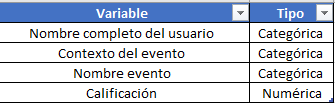

Luego de integrar los datos de calificaciones y de interacciones en el curso, y de eliminar la variables  que no aportan con información relevante para la predicción  es decir que son constantes o su información es 0, se realiza la transformación de los datos 509 estudiantes   con 78  variables:  30 Numericas y 48 Categoricas.

Es importante reconocer que hay 29 variables que contienen valores de 0 dentro de sus registros en diferentes porcentajes,  dichas variables permanecen dado que puedene brindar información relevante para el modelo.  

## Separación de datos

In [179]:
X = dataset.drop(["Name", "RESULTADO"], axis=1)
y = dataset["RESULTADO"]

stratified_splitter = StratifiedShuffleSplit(test_size=0.2, random_state=1234)

for full_train_index, test_index in stratified_splitter.split(X, y):
    full_X_train, full_y_train = X.iloc[full_train_index], y.iloc[full_train_index]
    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

## Pipeline
Teniendo en cuenta que los datos fueron generados no consideramos necesarias mayores tranformaciones, ya son datos numericos, no hay valores vacios o fuera de rango, pero nos parece oportuno armar un pipeline asi sea con una sola tarea
de normalizacion por si podemos integrar más datos.

In [180]:
estimators = [
              ('normalize',MinMaxScaler()),
              ]
pipe = Pipeline(estimators)
X_mod = pipe.fit_transform(X)
data_mod = pd.DataFrame(X_mod,columns=X.columns)
data_mod.head()

,curso: teoria de sistemas en las organizaciones - (204016a_951) - curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de notas de usuario visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - modulo de curso visto,foro: foro noticias del curso - tema visto,foro: foro noticias del curso - modulo de curso visto,pagina: encuentros sincronicos via webconferencia - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe usuario del curso visto,tarea: unidad 1 - fase 2 - identificacion y analisis - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,foro: foro de discusion - unidad 2 - fase 3 - modelamiento - tema visto,pagina: unidad 1 - conceptualizacion de la tso - contenidos y referentes bibliogràficos - modulo de curso visto,tarea: unidad 2 - fase 3 - modelamiento - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 4 - sustentacion final - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,curso: teoria de sistemas en las organizaciones - (204016a_951) - perfil de usuario visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - lista de usuarios vista,foro: foro general del curso - tema visto,foro: foro general del curso - modulo de curso visto,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - se ha visualizado el estado de la entrega.,tarea: fase 1 - historia de la teoria de sistemas - rubrica de evaluacion y entrega de la actividad - retroalimentacion vista,pagina: agenda del curso teoria de sistemas en las organizaciones - modulo de curso visto,curso: teoria de sistemas en las organizaciones - (204016a_951) - informe de resumen de notas visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 2 - fase 3 - modelamiento - directorio descargado en formato zip,contenido interactivo: linea de tiempo cibernetica - modulo de curso visto,pagina: unidad 2 - aplicaciones de la tso - contenidos y referentes bibliograficos - modulo de curso visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - tema visto,foro: foro de discusion - unidad 1 - fase 2 - identificacion y analisis - modulo de curso visto,carpeta: guia de actividades y rubrica de evaluacion - unidad 1 - fase 2 - identificacion y analisis - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - directorio descargado en formato zip,carpeta: guia de actividades y rubrica de evaluacion - fase 1 - historia de la teoria de sistemas - modulo de curso visto,carpeta: syllabus del curso teoria de sistemas en las organizaciones - modulo de curso visto,pagina: acompañamiento b-learning - in situ - modulo de curso visto,pagina: atencion sincronica via skype - modulo de curso visto,consulta: normas y condiciones para el desarrollo del curso - modulo de curso visto,consulta: normas y condiciones para el desarrollo del curso - consulta respondida,consulta: normas y condiciones para el desarrollo del curso - finalizacion de actividad de curso actualizada,contenido interactivo: presentacion del curso teoria de sistemas en las organizaciones - modulo de curso visto,contenido interactivo: presentacion del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada,pagina: agenda del curso teoria de sistemas en las organizaciones - finalizacion de actividad de curso actualizada,curso: teoria de sist

##**Selección de variables**

Continuando con el proceso de preparación de datos vamos a realizar una primera experiemntación  en  la seleción de variables a partir  de un arbol de decisiones para revisar el comportamiento de las variables.

In [181]:
k_fold = KFold(n_splits=10) # Numero deseado de "folds" que haremos
accuracies = list()
max_attributes = len(list(dataset))
depth_range = range(1, max_attributes +1 )


In [182]:
dataset=dataset.set_index("Name")

 Vamos  a testearemos la profundidad del arbol  de 1 a cantidad de atributos +1

In [183]:
for depth in depth_range:
    fold_accuracy = []
    tree_model = tree.DecisionTreeClassifier(criterion='entropy',
                                             min_samples_split=10,
                                             min_samples_leaf=5,
                                             max_depth = depth,
                                             class_weight={1:1.7})# 1.7 corresponde de dividir 357/212
    for train_fold, valid_fold in k_fold.split(dataset):
        f_train =dataset.iloc[train_fold] 
        f_valid =dataset.iloc[valid_fold] 
        model = tree_model.fit(X = f_train.drop(['RESULTADO'], axis=1), 
                               y = f_train["RESULTADO"]) 
        valid_acc = model.score(X = f_valid.drop(['RESULTADO'], axis=1), 
                              y = f_valid['RESULTADO'])
        fold_accuracy.append(valid_acc)
    avg = sum(fold_accuracy)/len(fold_accuracy)
    accuracies.append(avg)


 Calculamos la precision con el segmento de validación y  mostramos los resultados obtenidos

In [220]:
df = pd.DataFrame({"Max Depth": depth_range, "Average Accuracy": accuracies})
df = df[["Max Depth", "Average Accuracy"]]
#print(df.to_string(index=False))

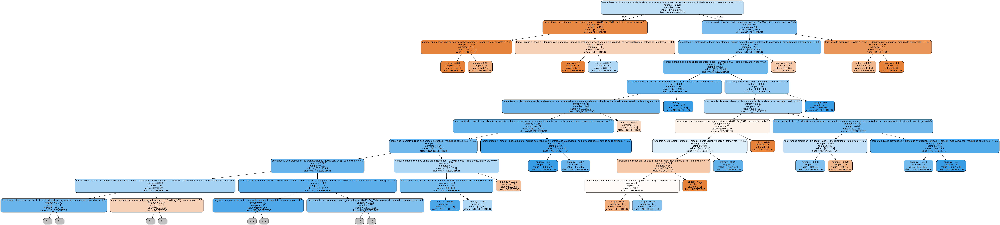

In [221]:
dot_data = tree.export_graphviz(tree_model,
                                max_depth = 10,
                                impurity = True,
                                feature_names = list(dataset.drop(['RESULTADO'], axis=1)),
                                class_names = ['DESERTOR', 'NO_DESERTOR'],
                                rounded = True,
                                filled= True)
graph = graph_from_dot_data(dot_data)
graph.write_png('tree5.png')
display1.display(Image.open('tree5.png'))

In [222]:
model=tree_model.fit(full_X_train, full_y_train)
y_pred=model.predict(X_test)
tree_report = classification_report(y_test, y_pred)
print(tree_report)

              precision    recall  f1-score   support

           0       0.75      0.60      0.67        55
           1       0.62      0.77      0.69        47

    accuracy                           0.68       102
   macro avg       0.69      0.68      0.68       102
weighted avg       0.69      0.68      0.68       102



Se crea el arbol de decision  de acuerdo a la importancia de las feactures

In [224]:
#se crea el arbol de decision  de acuerdo a la importancia de las feactures
clf = ExtraTreesClassifier(n_estimators=50)
model_tree = clf.fit(full_X_train, full_y_train)
model_tree.feature_importances_ 

array([4.82647959e-02, 2.42091665e-02, 2.60515095e-02, 2.68833547e-02,
       1.61066539e-02, 1.46381605e-02, 9.16069966e-03, 9.57400260e-03,
       1.45490128e-02, 4.13776774e-03, 1.12952244e-02, 8.51616557e-03,
       2.65279201e-02, 6.85611401e-03, 3.68119955e-03, 2.04720364e-02,
       3.57447288e-02, 7.01015097e-03, 8.34757699e-03, 2.30150635e-02,
       2.00309778e-02, 1.18964108e-02, 1.90008387e-03, 8.40601901e-03,
       2.08119075e-02, 1.83965600e-02, 2.81942072e-02, 3.11168539e-02,
       2.08555076e-02, 6.49424298e-03, 1.39201730e-02, 6.21448944e-03,
       6.76187211e-03, 9.67245567e-03, 2.78810542e-04, 1.04507799e-03,
       3.51490566e-04, 1.23137501e-03, 5.10061636e-04, 4.36022816e-04,
       4.45235195e-05, 1.34411203e-03, 1.47636806e-03, 8.29976402e-04,
       2.18965863e-03, 1.75361456e-02, 1.96201580e-02, 2.37517911e-02,
       9.64436922e-03, 4.27981308e-02, 1.59027134e-02, 3.78829412e-03,
       6.31151977e-03, 2.01708205e-03, 2.40820891e-04, 3.22710116e-04,
      

Se decide aplicar un PCA para realizar una reducción de dimensionalidad, en este caso de 78 variables pasar a un modelo con 2 componentes o dimensiones 

In [225]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)

In [226]:
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, y], axis = 1)

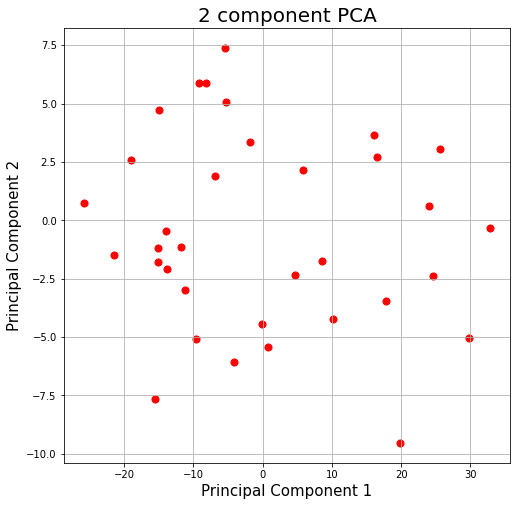

In [229]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
rating = [4]#, 2, '3' ,'4' ,'5']
colors = ['r']#, 'g', 'b', 'y', 'w']

for rating, color in zip(y,colors):
    indicesToKeep = finalDf['RESULTADO'] == rating
    #print(indicesToKeep)
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
#ax.legend(rating)
ax.grid()

In [230]:
explained_variance = pca.explained_variance_ratio_

In [231]:
print("Tamaño de total_data", dataset.shape)
print("Tamaño of X_pca", principalComponents.shape)
display(pca.components_)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:5]))

Tamaño de total_data (509, 76)
Tamaño of X_pca (509, 2)


array([[ 9.16795013e-01,  6.90829014e-02,  7.54282769e-02,
         4.05127256e-02,  8.12790984e-03,  1.24664717e-02,
         1.54355485e-02,  1.85839079e-02,  3.35613109e-02,
         7.10534869e-03,  4.39729720e-03,  9.39421168e-03,
         9.23292285e-02,  2.95258921e-03,  1.00286937e-03,
         1.45640560e-02,  3.99130623e-02,  7.42659194e-03,
         1.24211053e-02,  1.79974235e-02,  1.17440482e-02,
         7.81048853e-03,  4.94499888e-03,  1.95784234e-03,
         5.02994147e-03,  1.44714753e-02,  2.63400557e-01,
         2.44425658e-01,  4.43346842e-03,  2.76848780e-04,
         4.43905557e-03,  1.06949182e-03,  7.94957627e-03,
         7.18679745e-03, -1.37437602e-03, -5.71761308e-04,
        -5.71761308e-04, -1.15453525e-04, -1.14352262e-03,
        -1.14352262e-03, -3.69224955e-04,  2.71794747e-05,
         2.71794747e-05,  2.03430810e-04,  1.42724770e-03,
         4.04653012e-02,  4.36049067e-02,  1.52970774e-02,
         1.28913719e-02,  1.05077712e-02,  1.28913719e-0

[0.81054902 0.0744729 ]
suma: 0.8850219125482425


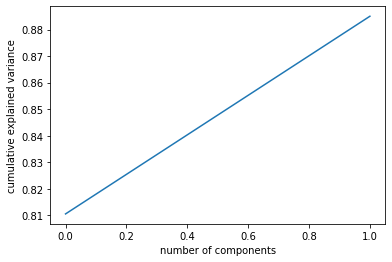

In [232]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [234]:
classifier= RandomForestClassifier(random_state = 42, criterion='entropy',
                                    n_estimators = 200,
                                    min_samples_split=5,
                                    min_samples_leaf=2)
classifier.fit(full_X_train, full_y_train)
# Predicting the Test set results
y_pred = classifier.predict(X_test)
#print(y_pred)

In [235]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred, ))
print(recall_score(y_test, y_pred, average='weighted'))
print(f1_score(y_test, y_pred, average='weighted'))

[[31 24]
 [ 9 38]]
0.6764705882352942
0.6764705882352942
0.673189990626864
